# Neural Style Transfer
---

This notebook contains a typical machine learning/computer vision problem: **Neural Style Transfer**. With a content image (C) and a style image (S), we are able to generate a image (G) with C's content and S's style. The following images show how a photo can be combined with Van Gogh's painting and generate a new image.

<img src="sea.jpg" alt="drawing" width="400"/>
<center>Content Image: C</center>  

<img src="van.jpg" alt="drawing" width="300"/>
<center>Style Image: S</center> 
<img src="G_van.jpg" alt="drawing" width="400"/>
<center>Generated Image: G</center>  

---
### Acknowledgement:
Some ideas come from [Deep Learning Course on Coursera](https://www.deeplearning.ai/deep-learning-specialization/) (e.g., the weights of style loss and content loss) and [Pytorch tutorial](https://pytorch.org/tutorials/) (e.g. model loading).

## 1. Packages and Images Preprocessing

In [23]:
import numpy as np
import torch
import torch.nn as nn
import torchvision
from torch.autograd import Variable
import torchvision.transforms as transforms
import torch.nn.functional as F
import torchvision.models as models
from PIL import Image
import matplotlib.pyplot as plt

Helper functions:  
*show*:Show the original image.  
*image_loader*: Preprocess the image.

In [24]:
def show(img):
    """Show image with size (width, height, channels).
    """
    plt.figure(figsize= (15,10))
    plt.imshow(img)
    plt.show()
    
def image_loader(path):
    """Given the path of the image, return the image tensor to feed in the model.
    """
    img = Image.open(path).convert('RGB')
    # Resize the image, crop the image, convert the image to tensor.
    loader = transforms.Compose([
                            transforms.Resize(700),
                            transforms.CenterCrop([700,900]),
                            transforms.ToTensor()])
    img = loader(img)
    return img

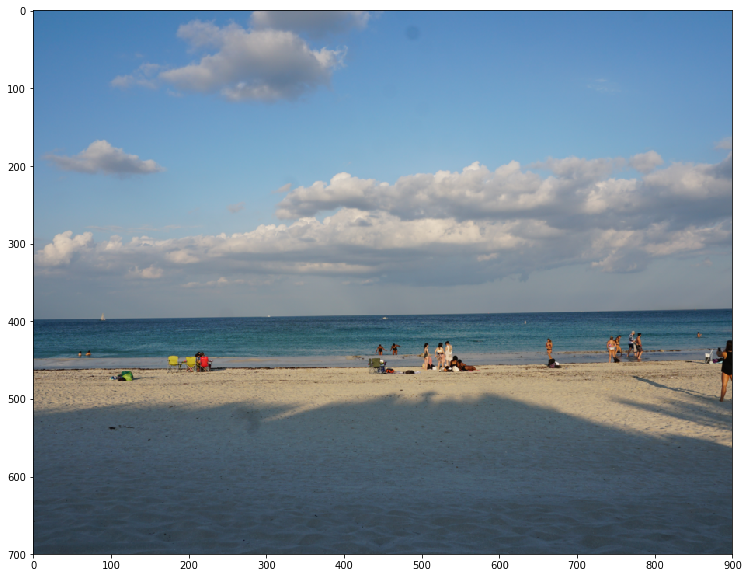

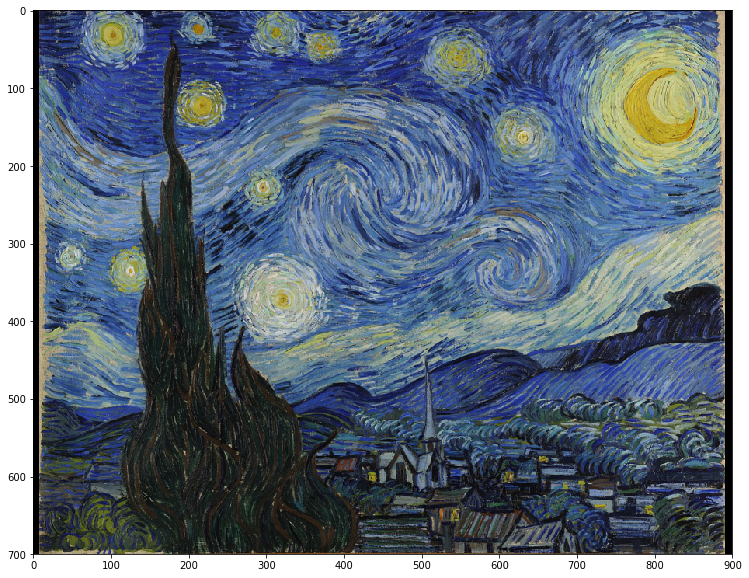

In [25]:
C = image_loader('sea.jpg')
S = image_loader('van.jpg')
# Show content image
show(C.permute(1,2,0))
# Show style image
show(S.permute(1,2,0))

## 2. Define Loss Function

The total loss is composed of content loss $J_{content}$ and style loss $J_{style}$.  
**Content Loss:**  
$$J_{content}(C,G) =  \frac{1}{4 \times n_H \times n_W \times n_C}\sum _{ \text{all entries}} (a^{(C)} - a^{(G)})^2\ $$  
Where $a^{(C)}$ and $a^{(G)}$ are the activation values in some layer.

**Style Loss:**  
$$J_{style}^{[l]}(S,G) = \frac{1}{4 \times {n_C}^2 \times (n_H \times n_W)^2} \sum _{i=1}^{n_C}\sum_{j=1}^{n_C}(G^{(S)}_{ij} - G^{(G)}_{ij})^2$$

$$J_{style}(S,G) = \sum_{l} \lambda^{[l]} J^{[l]}_{style}(S,G)$$
Where $G^{(G)}_{ij}$ is the value of gram matrix of $G$ at position $i,j$.


**Content Loss:**

In [26]:
def content_loss(a_C, a_G):
    """Compute the content loss of the generated image.
    """
    # Get the size of activation
    m, n_c, n_h, n_w = a_G.size()
    
    J_content = 1/(4*n_h*n_c*n_w)*(torch.norm(a_C - a_G)**2)
    return J_content

**Style Layer Loss:**  
Compute the gram matrix first and the compute the style loss in one layer.

In [27]:
def gram_matrix(A):
    """A of size n_c, n_h*n_w
        Output size n_c,n_c
    """
    A_trans = torch.transpose(A,0,1)
    GM = torch.mm(A, A_trans)
    return GM

def style_layer_loss(a_S, a_G):
    """Given the hidden layer activations of style and generated image, compute the layer style loss.
    
    """
    # get the size of the input tensor
    m, n_c, n_h, n_w = a_G.size()
    
    # resize the tensor to (n_c, n_h*n_w).
    a_G = a_G.view(n_c, n_h*n_w)
    a_S = a_S.view(n_c, n_h*n_w)
    
    GM_S = gram_matrix(a_S)
    GM_G = gram_matrix(a_G)
    
    # conpute the layer style loss
    J_style_layer = 1/(4*(n_c**2)*(n_h*n_w)**2)*(torch.norm(GM_S - GM_G)**2)
    
    return J_style_layer

## 3. Load the Model  
Pretrained model VGG19 is used to compute the activation and the loss.

In [33]:

# Move the model to GPU if possible.
device = torch.device("cuda:0" if torch.cuda.is_available else "cpu")
# Set the model to evaluation mode.
model = models.vgg19(pretrained = True).features.to(device)
model.eval()

Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace)
  (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (17): ReLU(inplace)
  (18): MaxPool2d(kernel_size=2, stride=2, padding=0, 

## 4. Compute Loss  
Define layers in the model to compute the activation values.

In [34]:
# Set desired layers to compute loss
style_layers = ['conv_1', 'conv_2', 'conv_3', 'conv_4','conv_6']
content_layers = ['conv_5']



Build the model for NST and compute the loss.

In [35]:


class Normalization(nn.Module):
    """VGG19 was pretrained with normialized, set a normalization layer for each input image.
    """
    def __init__(self, mean, std):
        super().__init__()
        self.mean = torch.tensor(mean).view(-1,1,1)
        self.std = torch.tensor(mean).view(-1,1,1)
    def forward(self, x):
        
        return (x-self.mean)/self.std

def get_loss_model(model,content_image, style_image, input_image,
                   c_layers = content_layers, s_layers = style_layers,
                  mean= torch.tensor([0.485, 0.456, 0.406]), std= torch.tensor([0.229, 0.224, 0.225])):
    """Compute content loss and style layer loss given model, input image, content image and style image.
    """
    normalization = Normalization(mean, std)
    NST_model = nn.Sequential(normalization)
    J_layer_style = []
    i = 0
    for layer in model.children():
        
        if isinstance(layer, nn.Conv2d):
            i +=1
            name = 'conv_{}'.format(i)
            # Break the loop if it reaches the last layer of style loss
        elif isinstance(layer, nn.ReLU):
            name = 'relu_{}'.format(i)
        elif isinstance(layer, nn.MaxPool2d):
            name = 'max_pool_'.format(i)
        elif isinstance(layer, nn.BatchNorm2d):
            name = 'bn_{}'.format(i)
        else:
            raise RuntimeError('Unrecognized layer: {}'.format(layer.__class__.__name__))
            
        NST_model.add_module(name, layer)
        
        # compute the content loss
        if name in c_layers:
            a_C = NST_model(content_image).clone().detach()
            a_G = NST_model(input_image)
            J_content = content_loss(a_C, a_G)
        # coompute the style loss
        J_layer = []
        if name in s_layers:
            a_S = NST_model(style_image).clone().detach()
            a_G = NST_model(input_image)
            J_layer_style.append(style_layer_loss(a_S, a_G))
        
            
        if name == style_layers[-1]:
            break
    
    return J_content, J_layer_style, NST_model

def total_loss(J_content, J_layer_style, coefs=[0.2,0.2,0.2,0.2,0.2], alpha = 10, beta= 40):
    """Given weights, compute total loss.
       coefs: the weights in each layer for style loss.
       alpha: the weight of content loss.
       beta: the weight of style loss.
    """
    J_style = 0
    for i in range(len(coefs)):
        J_style += coefs[i]*J_layer_style[i]
        
    J_total = alpha*J_content + beta*J_style
    
    return J_total
        

## 5. Define the optimizer

In [38]:
# Use Adam optimizer.
def get_optimizer(input_image):
    
    optimizer = torch.optim.Adam([input_image.requires_grad_()], lr = 0.001)
    return optimizer

## 6. Run the model

/home/sh2439/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:8: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  
/home/sh2439/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:9: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  if __name__ == '__main__':


epoch:100, loss:18.858123779296875


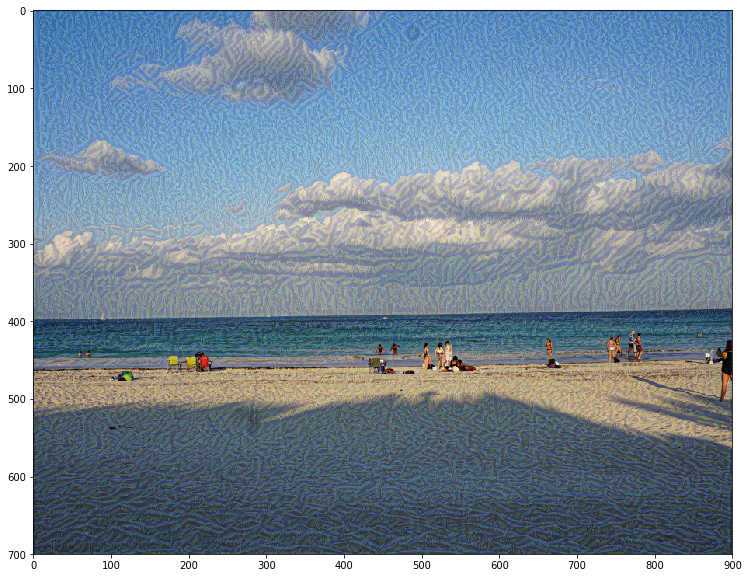

epoch:200, loss:7.409834861755371


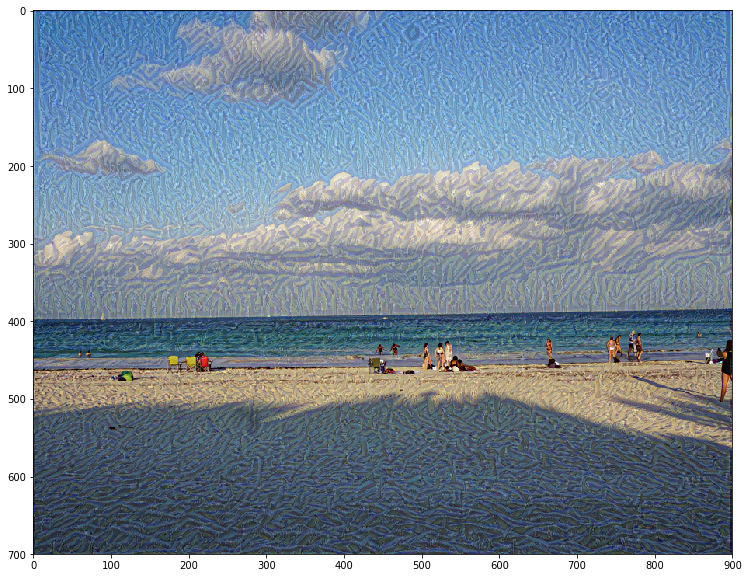

epoch:300, loss:5.067898273468018


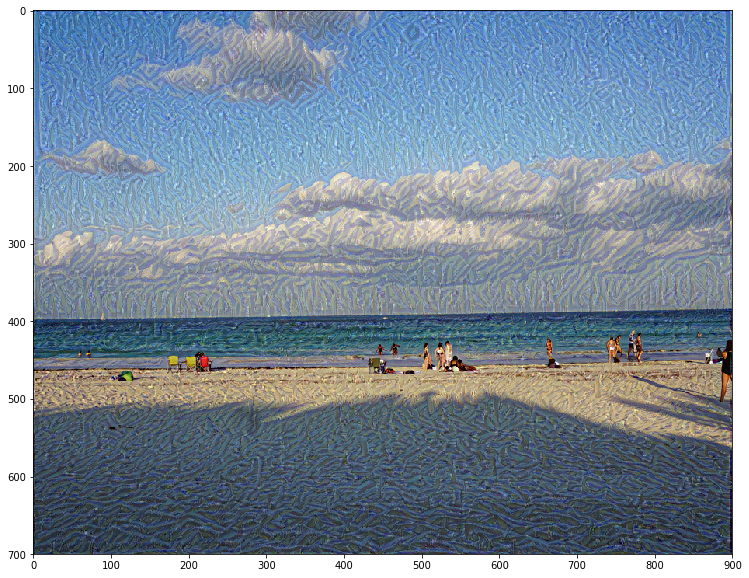

epoch:400, loss:3.9925529956817627


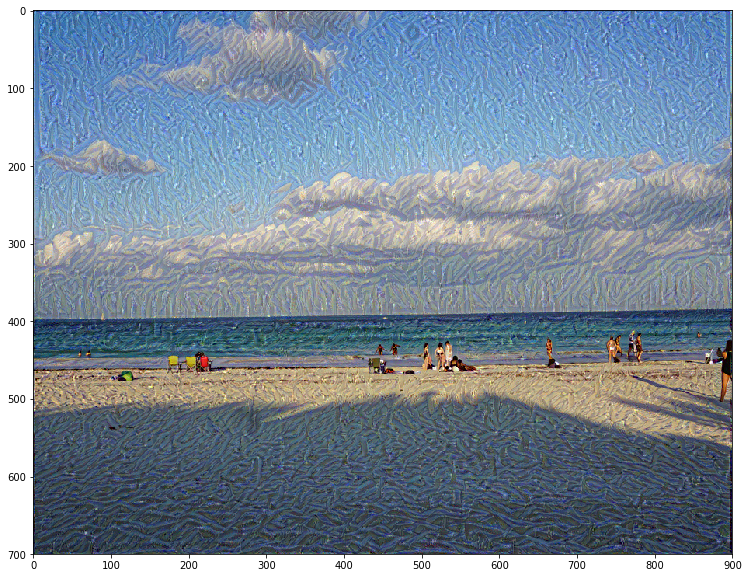

epoch:500, loss:3.337003707885742


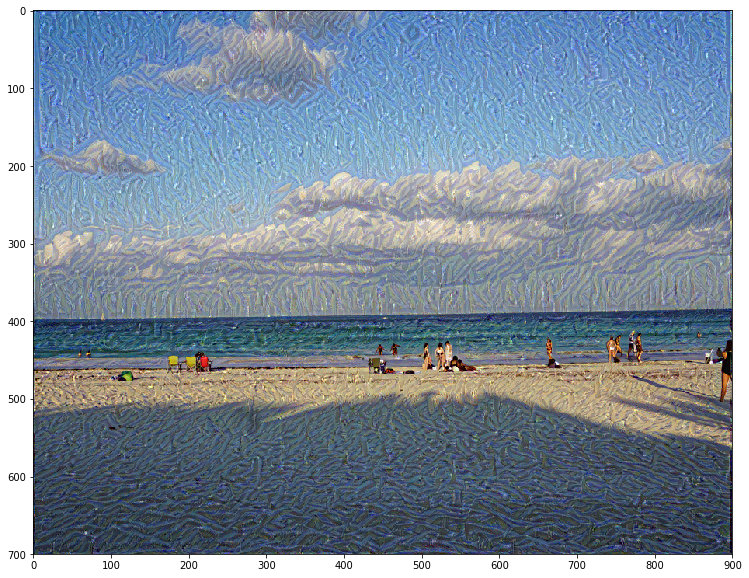

epoch:600, loss:2.8825972080230713


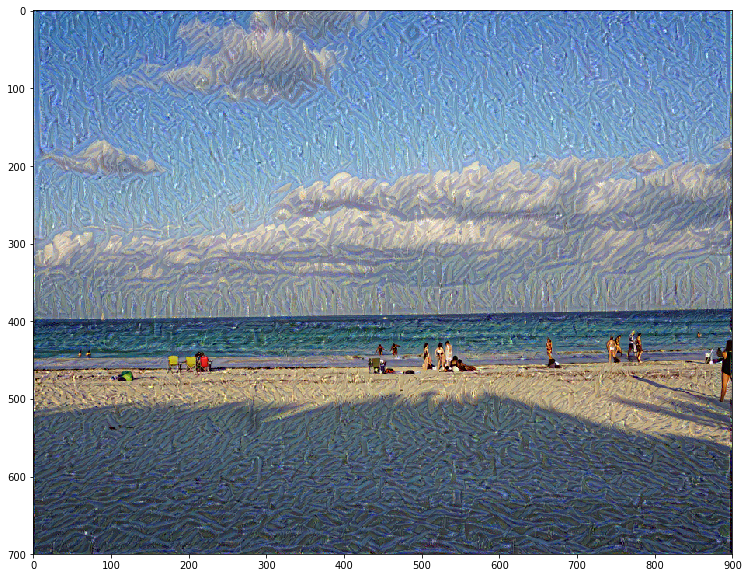

epoch:700, loss:2.5495362281799316


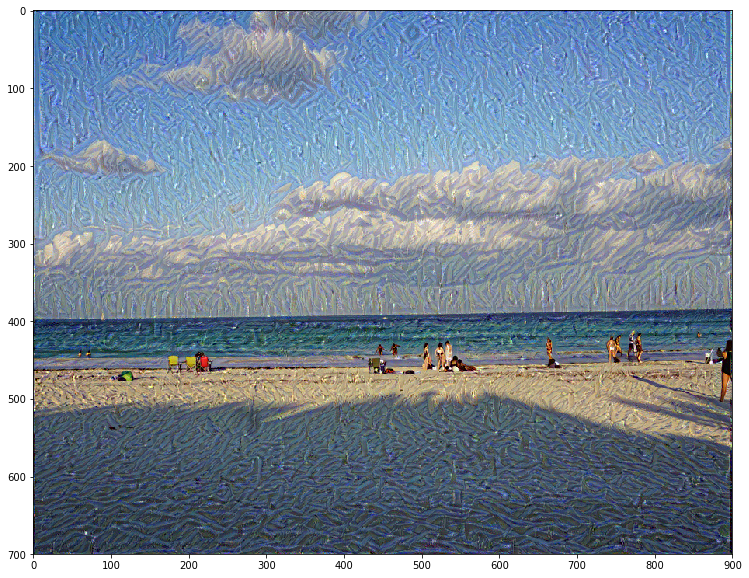

epoch:800, loss:2.286881685256958


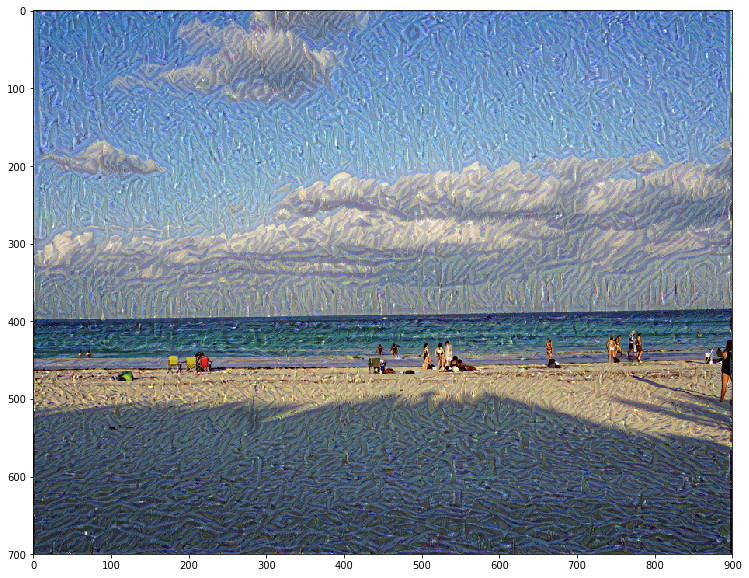

epoch:900, loss:2.018961191177368


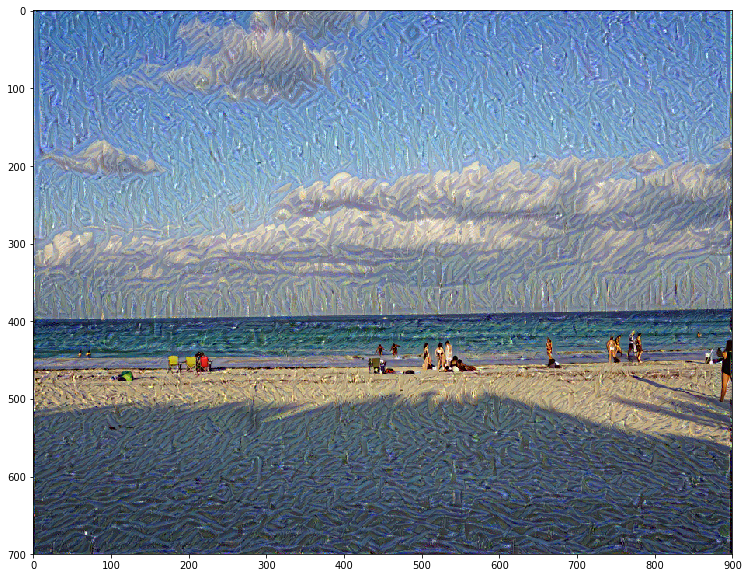

epoch:1000, loss:1.760884404182434


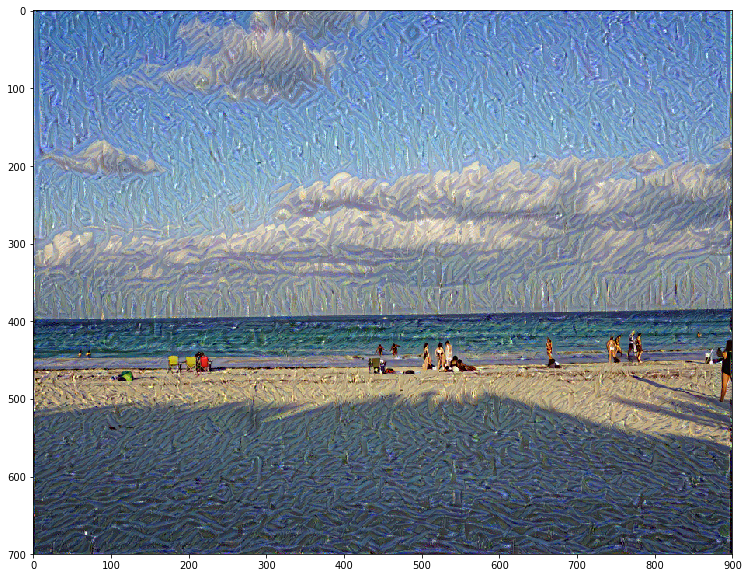

In [39]:
num_epochs = 1000

# Define the content image and style image.
content_image = image_loader('sea.jpg').unsqueeze(0).to(device)
style_image = image_loader('van.jpg').view(content_image.size()).to(device)
#input_image = torch.randn(style_image.data.size())

# Set the input image to be content image.
input_image = content_image

for epoch in range(num_epochs):
    epoch +=1
    input_image = Variable(input_image).to(device)
    
    input_image.data.clamp_(0, 1)   
    optimizer = get_optimizer(input_image)
    optimizer.zero_grad()
    J_content, J_layer_style, NST_model = get_loss_model(model, content_image, style_image, input_image,
                                                         c_layers = content_layers, s_layers = style_layers, 

                  mean= torch.tensor([0.485, 0.456, 0.406]).to(device), 
                  std= torch.tensor([0.229, 0.224, 0.225]).to(device))

    

    loss = total_loss(J_content, J_layer_style, coefs=[0.2,0.2,0.2,0.2,0.2], alpha = 10, beta= 400)
    loss.backward()
    optimizer.step()
    
    # Show the image every 100 epochs.
    if epoch%100 == 0:
        print('epoch:{}, loss:{}'.format(epoch, loss.data))
        img = input_image.to('cpu').clone().detach()
        img = img.squeeze()
        img = img.permute(1,2,0)
        img = np.array(img).clip(0,1)
        show(img)